# Colab Setup

In [0]:
!nvidia-smi

Sat Sep 28 05:13:10 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 430.40       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
!pip install gdown --quiet

In [0]:
!mkdir logs

In [0]:
!pip install scikit-plot --quiet

In [0]:
!apt-get -qq install -y graphviz && pip install -q pydot --quiet

In [0]:
!pip install tensorflow-gpu==2.0.0-beta1 --quiet

     |████████████████████████████████| 348.9MB 1.3MB/s 
     |████████████████████████████████| 3.1MB 30.3MB/s 
     |████████████████████████████████| 501kB 48.3MB/s 


In [0]:
!pip install keras-rectified-adam --quiet

# Library imports and data setup

## Imports

In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
import os
os.environ['TF_KERAS'] = '1'

In [0]:
%env TF_KERAS = 1

env: TF_KERAS=1


In [0]:
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path


from tensorflow.keras.callbacks import ModelCheckpoint,CSVLogger,LearningRateScheduler
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import AveragePooling2D

from tensorflow.keras.layers import concatenate
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras import regularizers
from tensorflow.keras import backend
from tensorflow.keras.layers import Lambda
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import add

from tensorflow.keras.callbacks import TensorBoard
import tensorflow as tf

import pickle
from keras_radam import RAdam
import gdown
import scikitplot as skplt
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import model_from_json

In [0]:
                            # Set up 'ggplot' style
plt.style.use('ggplot')     # if want to use the default style, set 'classic'
plt.rcParams['ytick.right']     = True
plt.rcParams['ytick.labelright']= True
plt.rcParams['ytick.left']      = False
plt.rcParams['ytick.labelleft'] = False
plt.rcParams['font.family']     = 'Arial'

## Setup dataset

In [0]:
Path.ls = lambda x: list(x.iterdir())

In [0]:
datapath = Path('./data')
logpath = Path('./logs')

In [0]:
# Download Raw Data
pickles_url = 'https://drive.google.com/uc?export=download&id=1inU1YzIre_Ane2sXu_EmB6DI8L48EZnI'
pickles_file = 'cnn_pickles_fixed.zip'

gdown.download(pickles_url, pickles_file, quiet=True)

'cnn_pickles_fixed.zip'

In [0]:
!unzip -qq /content/cnn_pickles_fixed.zip -d /content/data/

In [0]:
datapath.ls()

[PosixPath('/content/data/X3c64f.pickle'),
 PosixPath('/content/data/y3c64f.pickle')]

## Ensure interoperability between TF1 and TF2 Keras (beta)

In [0]:
if tf.__version__[0] == '2':
    valacc = 'val_accuracy'
    acc = 'accuracy'
else:
    valacc = 'val_acc'
    acc = 'acc'

## Shared Constants

In [0]:
img_size = 64
batch_size = 32
num_classes=3

## Setup data generators

In [0]:
X = pickle.load(open(datapath/"X3c64f.pickle","rb"))
y = pickle.load(open(datapath/"y3c64f.pickle","rb"))

X = X.astype('float32')/255
y = to_categorical(y)

In [0]:
trDat = X[0:2860]
tsDat = X[2860:]

trLbl = y[0:2860]
tsLbl = y[2860:]

In [0]:
seed        = 29
np.random.seed(seed)

In [0]:
datagen = ImageDataGenerator(width_shift_range=0.1,
                             height_shift_range=0.1,
                             rotation_range=20,
                             horizontal_flip=True,
                             vertical_flip=False)

# Build Standard Convolutional Neural Network

## Create Model

In [0]:
def createCNNModel():
  
    inputs = Input(shape=(64,64,3))
    
    z = Conv2D(64,(3,3),padding='same',activation='relu')(inputs)
    z = MaxPooling2D(pool_size=(2,2))(z)
    
    z = Conv2D(96,(3,3),padding='same',activation='relu')(z)
    z = MaxPooling2D(pool_size=(2,2))(z)
    
    z = Conv2D(128,(3,3),padding='same',activation='relu')(z)
    z = MaxPooling2D(pool_size=(2,2))(z)
    
    z = Flatten()(z)
    z = Dense(256,activation='relu')(z)
    z = Dense(3,activation='softmax')(z)
    
    model = Model(inputs=inputs,outputs=z)
    model.compile(loss="categorical_crossentropy",optimizer="adam",metrics=['accuracy'])
    
    
    return model

In [0]:
# Setup the models
CNNModel       = createCNNModel() # This is meant for training
CNNModelGo     = createCNNModel() # This is used for final testing

CNNModel.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 64, 64, 64)        1792      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 32, 32, 96)        55392     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 16, 16, 96)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 16, 16, 128)       110720    
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 8, 8, 128)         0   

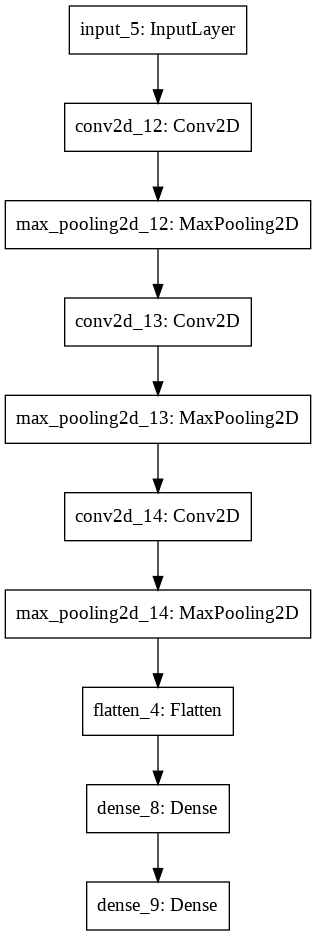

In [0]:
plot_model(CNNModel, to_file='CNNModel.png')

## Train Model

In [0]:
modelname = 'CNNModel'

In [0]:
with open(f'{modelname}_arch.json', 'w') as f:
    f.write(CNNModel.to_json())

In [0]:
                            # Create checkpoint for the training
                            # This checkpoint performs model saving when
                            # an epoch gives highest testing accuracy
filepath        = modelname + ".hdf5"
checkpoint      = ModelCheckpoint(filepath, 
                                  monitor=valacc, 
                                  verbose=0, 
                                  save_best_only=True, 
                                  mode='max')

                            # Log the epoch detail into csv
csv_logger      = CSVLogger(modelname +'.csv')

tensorboard = TensorBoard(log_dir='./logs', histogram_freq=1, write_graph=True, write_images=True)

callbacks_list  = [checkpoint,csv_logger,tensorboard]

In [0]:
CNNModel.fit(trDat,trLbl,validation_data=(tsDat, tsLbl),epochs=150,batch_size=64,shuffle=True,callbacks=callbacks_list)

Train on 2860 samples, validate on 568 samples
Epoch 1/150
2860/2860 [==============================] - 3s 884us/sample - loss: 0.2324 - accuracy: 0.9199 - val_loss: 0.6079 - val_accuracy: 0.7852
Epoch 2/150
2860/2860 [==============================] - 3s 919us/sample - loss: 0.1537 - accuracy: 0.9434 - val_loss: 0.6251 - val_accuracy: 0.7940
Epoch 3/150
2860/2860 [==============================] - 3s 885us/sample - loss: 0.1155 - accuracy: 0.9601 - val_loss: 0.7871 - val_accuracy: 0.7623
Epoch 4/150
2860/2860 [==============================] - 3s 884us/sample - loss: 0.0995 - accuracy: 0.9650 - val_loss: 0.9920 - val_accuracy: 0.7183
Epoch 5/150
2860/2860 [==============================] - 3s 886us/sample - loss: 0.0771 - accuracy: 0.9741 - val_loss: 0.8639 - val_accuracy: 0.7764
Epoch 6/150
2860/2860 [==============================] - 3s 885us/sample - loss: 0.0388 - accuracy: 0.9892 - val_loss: 0.9204 - val_accuracy: 0.7764
Epoch 7/150
2860/2860 [==============================] - 3s

## Evaluate Model

In [0]:
                            # Now the training is complete, we get
                            # another object to load the weights
                            # compile it, so that we can do 
                            # final evaluation on it
CNNModelGo.load_weights(filepath)
CNNModelGo.compile(loss='categorical_crossentropy', 
                   optimizer='adam', 
                   metrics=['accuracy'])

In [0]:
predicts    = CNNModelGo.predict(tsDat)

In [0]:
                            # Prepare the classification output
                            # for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['Roti Prata',
               'Chicken Rice',
               'Bak Chor Mee',]

In [0]:
testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)

### Classifier Performance

In [0]:
print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 80.11%
              precision    recall  f1-score   support

  Roti Prata     0.7487    0.7814    0.7647       183
Chicken Rice     0.8106    0.8106    0.8106       227
Bak Chor Mee     0.8533    0.8101    0.8312       158

    accuracy                         0.8011       568
   macro avg     0.8042    0.8007    0.8021       568
weighted avg     0.8025    0.8011    0.8015       568

[[143  28  12]
 [ 33 184  10]
 [ 15  15 128]]


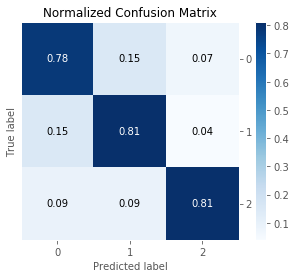

In [0]:
skplt.metrics.plot_confusion_matrix(testout, predout, normalize=True)

### Visualize Accuracy and Loss Metrics

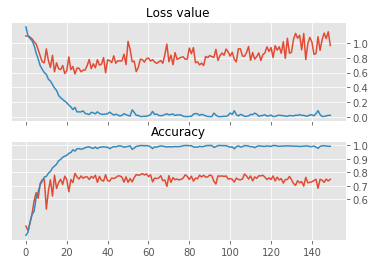

In [0]:
records     = pd.read_csv(modelname +'.csv')
plt.figure()
plt.subplot(211)
plt.plot(records['val_loss'])
plt.plot(records['loss'])
plt.yticks([0,0.20,0.40,0.60,0.80,1.00])
plt.title('Loss value',fontsize=12)

ax          = plt.gca()
ax.set_xticklabels([])



plt.subplot(212)
plt.plot(records[valacc])
plt.plot(records[acc])
plt.yticks([0.6,0.7,0.8,0.9,1.0])
plt.title('Accuracy',fontsize=12)
plt.show()

### Interactive Visualization with Tensorboard

In [0]:
%load_ext tensorboard

In [0]:
%tensorboard --logdir ./logs

# Build ResNet Model

## Define helper functions

In [0]:
def resLyr(inputs,
           numFilters=32,
           kernelSz=3,
           strides=1,
           activation='relu',
           batchNorm=True,
           convFirst=True,
           lyrName=None):

    convLyr = Conv2D(numFilters,kernel_size=kernelSz,strides=strides,padding='same',kernel_regularizer=l2(1e-4),name=lyrName+'_conv' if lyrName else None) #,kernel_initializer='he_normal'
    x = inputs
    if convFirst:
        x = convLyr(x)
        if batchNorm:
            x = BatchNormalization(name=lyrName+'_bn' if lyrName else None)(x)
        if activation is not None:
            x = Activation(activation,name=lyrName+'_'+activation if lyrName else None)(x)
    else:
        if batchNorm:
            x = BatchNormalization(name=lyrName+'_bn' if lyrName else None)(x)
        if activation is not None:
            x = Activation(activation,name=lyrName+'_'+activation if lyrName else None)(x)
        x = convLyr(x)

    return x


def resBlkV1(inputs,
             numFilters=16,
             numBlocks=3,
             downsampleOnFirst=True,
             names=None):
    
    x = inputs
    for run in range(0,numBlocks):
        strides = 1
        blkStr = str(run+1)
        if downsampleOnFirst and run == 0:
            strides = 2
        y = resLyr(inputs=x,numFilters=numFilters,strides=strides,lyrName=names+'_Blk'+blkStr+'_Res1' if names else None)
        y = resLyr(inputs=y,numFilters=numFilters,activation=None,lyrName=names+'_Blk'+blkStr+'_Res2' if names else None)
        if downsampleOnFirst and run == 0:
            x = resLyr(inputs=x,numFilters=numFilters,kernelSz=1,strides=strides,activation=None,batchNorm=False,lyrName=names+'_Blk'+blkStr+'_lin' if names else None)
        x = add([x,y],name=names+'_Blk'+blkStr+'_add' if names else None)
        x = Activation('relu',name=names+'_Blk'+blkStr+'_relu' if names else None)(x)
   
    return x

## Create Model

In [0]:
def createResNetModel(inputShape=(64,64,3),numClasses=3):
    inputs = Input(shape=inputShape)
    v = resLyr(inputs,lyrName='Inpt')
    v = resBlkV1(inputs=v,numFilters=32,numBlocks=3,downsampleOnFirst=False,names='Stg1')
    v = resBlkV1(inputs=v,numFilters=64,numBlocks=3,downsampleOnFirst=True,names='Stg2')
    v = resBlkV1(inputs=v,numFilters=96,numBlocks=3,downsampleOnFirst=True,names='Stg3')
  

    v = AveragePooling2D(pool_size=16,name='AvgPool')(v)
    v = Flatten()(v)
    outputs = Dense(numClasses,activation='softmax')(v) #,kernel_initializer='he_normal'
    model = Model(inputs=inputs,outputs=outputs)
    model.compile(loss='categorical_crossentropy',optimizer=optmz,metrics=['accuracy'])
    
    return model

In [0]:
# Setup the models

optmz       = optimizers.RMSprop(lr=0.0001)

ResNetModel       = createResNetModel() # This is meant for training
ResNetModelGo     = createResNetModel() # This is used for final testing

ResNetModel.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
Inpt_conv (Conv2D)              (None, 64, 64, 32)   896         input_3[0][0]                    
__________________________________________________________________________________________________
Inpt_bn (BatchNormalization)    (None, 64, 64, 32)   128         Inpt_conv[0][0]                  
__________________________________________________________________________________________________
Inpt_relu (Activation)          (None, 64, 64, 32)   0           Inpt_bn[0][0]                    
____________________________________________________________________________________________

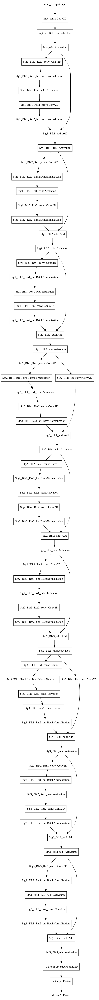

In [0]:
plot_model(ResNetModel, to_file='ResNetModel.png')

## Train Model

In [0]:
def lrSchedule(epoch):
    lr  = 1e-3
    
    if epoch > 160:
        lr  *= 0.5e-3
        
    elif epoch > 140:
        lr  *= 1e-3
        
    elif epoch > 120:
        lr  *= 1e-2
        
    elif epoch > 80:
        lr  *= 1e-1
        
    print('Learning rate: ', lr)
    
    return lr

In [0]:
modelname = 'ResNetModel'

In [0]:
with open(f'{modelname}_arch.json', 'w') as f:
    f.write(ResNetModel.to_json())

In [0]:
                            # Create checkpoint for the training
                            # This checkpoint performs model saving when
                            # an epoch gives highest testing accuracy
filepath        = modelname + ".hdf5"
checkpoint      = ModelCheckpoint(filepath, 
                                  monitor=valacc, 
                                  verbose=0, 
                                  save_best_only=True, 
                                  mode='max')

                            # Log the epoch detail into csv
csv_logger      = CSVLogger(modelname +'.csv')

tensorboard = TensorBoard(log_dir='./reslogs', histogram_freq=1, write_graph=True, write_images=True)

LRScheduler     = LearningRateScheduler(lrSchedule)

callbacks_list  = [checkpoint,csv_logger,tensorboard,LRScheduler]

In [0]:
ResNetModel.fit_generator(datagen.flow(trDat, trLbl, batch_size=batch_size),
                          validation_data=(tsDat, tsLbl),
                          epochs=200, 
                          verbose=1,
                          max_queue_size=100,
                          steps_per_epoch=len(trDat)/batch_size,
                          callbacks=callbacks_list)

Learning rate:  0.001
Epoch 1/200
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
60/59 [==============================] - 43s 717ms/step - loss: 1.2369 - accuracy: 0.5087 - val_loss: 2.1951 - val_accuracy: 0.2887
Learning rate:  0.001
Epoch 2/200
60/59 [==============================] - 17s 283ms/step - loss: 0.9025 - accuracy: 0.6657 - val_loss: 1.5937 - val_accuracy: 0.3081
Learning rate:  0.001
Epoch 3/200
60/59 [==============================] - 17s 285ms/step - loss: 0.7931 - accuracy: 0.7129 - val_loss: 1.3503 - val_accuracy: 0.4102
Learning rate:  0.001
Epoch 4/200
60/59 [==============================] - 17s 285ms/step - loss: 0.7197 - accuracy: 0.7476 - val_loss: 1.1515 - val_accuracy: 0.4613
Learning rate:  0.001
Epoch 5/200
60/59 [==============================] - 17s 286ms/step - loss: 0.6407 - accuracy: 0.7808 - val_loss: 0.8527 - val_accuracy: 0.6761
Learning rate:  0.001
Epoch 6/200
60/59 [==============================] - 1

## Evaluate Model

In [0]:
                            # Now the training is complete, we get
                            # another object to load the weights
                            # compile it, so that we can do 
                            # final evaluation on it
ResNetModelGo.load_weights(filepath)
ResNetModelGo.compile(loss='categorical_crossentropy', 
                      optimizer='adam', 
                      metrics=['accuracy'])

In [0]:
predicts    = ResNetModelGo.predict(tsDat)

In [0]:
                            # Prepare the classification output
                            # for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['Roti Prata',
               'Chicken Rice',
               'Bak Chor Mee',]

In [0]:
testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)

### Classifier Performance

In [0]:
print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 94.89%
              precision    recall  f1-score   support

  Roti Prata     0.9058    0.9454    0.9251       183
Chicken Rice     0.9679    0.9295    0.9483       227
Bak Chor Mee     0.9748    0.9810    0.9779       158

    accuracy                         0.9489       568
   macro avg     0.9495    0.9520    0.9505       568
weighted avg     0.9498    0.9489    0.9491       568

[[173   7   3]
 [ 15 211   1]
 [  3   0 155]]


/usr/local/lib/python3.6/dist-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


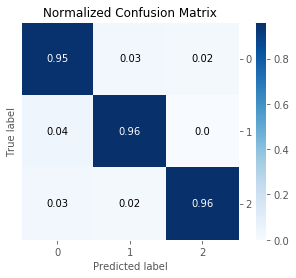

In [0]:
skplt.metrics.plot_confusion_matrix(testout, predout, normalize=True)

### Visualize Accuracy and Loss Metrics

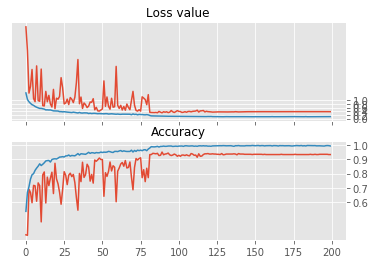

In [0]:
records     = pd.read_csv(modelname +'.csv')
plt.figure()
plt.subplot(211)
plt.plot(records['val_loss'])
plt.plot(records['loss'])
plt.yticks([0,0.20,0.40,0.60,0.80,1.00])
plt.title('Loss value',fontsize=12)

ax          = plt.gca()
ax.set_xticklabels([])



plt.subplot(212)
plt.plot(records[valacc])
plt.plot(records[acc])
plt.yticks([0.6,0.7,0.8,0.9,1.0])
plt.title('Accuracy',fontsize=12)
plt.show()

### Interactive Visualization with Tensorboard

In [0]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
%tensorboard --logdir ./reslogs

# Build VGGNet Model

## VGG16 Exploration

In [0]:
def VGG16():
    model = Sequential()
    model.add(Conv2D(64,(3,3),input_shape=(64, 64, 3),padding='same',activation='relu'))
    model.add(Conv2D(64,(3,3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(128, (3, 3),padding='same',activation='relu'))
    model.add(Conv2D(128, (3, 3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(256, (3, 3),padding='same',activation='relu'))
    model.add(Conv2D(256, (3, 3),padding='same',activation='relu'))
    model.add(Conv2D(256, (3, 3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(512, (3, 3),padding='same',activation='relu'))
    model.add(Conv2D(512, (3, 3),padding='same',activation='relu'))
    model.add(Conv2D(512, (3, 3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(512, (3, 3),padding='same',activation='relu'))
    model.add(Conv2D(512, (3, 3),padding='same',activation='relu'))
    model.add(Conv2D(512, (3, 3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Flatten())
    model.add(Dense(4096,activation='relu'))
    model.add(Dense(4096,activation='relu'))
    model.add(Dense(3,activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer=sgd,metrics=['accuracy'])
    return model

sgd = optimizers.SGD(lr=0.01, decay=0.00001, momentum=0.9, nesterov=True)

In [0]:
VGG16Model       = VGG16() # This is meant for training
VGG16Model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 256)       2

In [0]:
# only use 5 epoch for exploration 
VGG16Model.fit_generator(datagen.flow(trDat, trLbl, batch_size=batch_size),
                       validation_data=(tsDat, tsLbl),
                       epochs=5, 
                       verbose=1,
                       max_queue_size=100,
                       steps_per_epoch=len(trDat)/batch_size,
                       )

## Create Model

In [0]:
def createVGGModel():
    model = Sequential()
    model.add(Conv2D(64,(3,3),input_shape=(64, 64, 3),padding='same',activation='relu'))
    model.add(Conv2D(64,(3,3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(128, (3, 3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(256, (3, 3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(512, (3, 3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(512, (3, 3),padding='same',activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(128,activation='relu'))
    model.add(Dense(3,activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer=sgd,metrics=['accuracy'])
    return model

sgd = optimizers.SGD(lr=0.01, decay=0.00001, momentum=0.9, nesterov=True)

In [0]:
# Setup the models
VGGModel       = createVGGModel() # This is meant for training
VGGModelGo     = createVGGModel() # This is used for final testing

VGGModel.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 32, 32, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 16, 16, 256)       295168    
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 8, 8, 256)         0

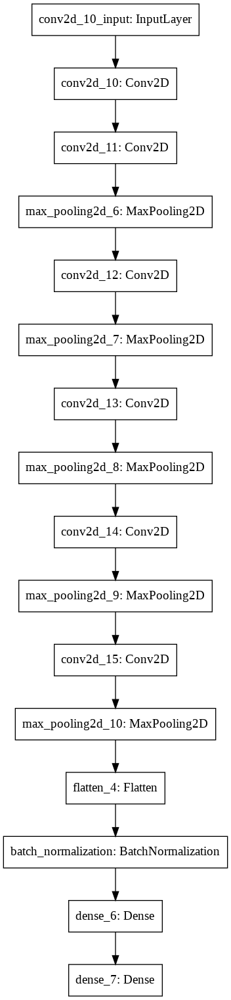

In [0]:
plot_model(VGGModel, to_file='VGGModel.png')

## Train Model

In [0]:
def lrSchedule(epoch):
    lr  = 1e-3
    
    if epoch > 160:
        lr  *= 0.5e-3
        
    elif epoch > 140:
        lr  *= 1e-3
        
    elif epoch > 120:
        lr  *= 1e-2
        
    elif epoch > 80:
        lr  *= 1e-1
        
    print('Learning rate: ', lr)
    
    return lr

In [0]:
modelname = 'VGGModel'

In [0]:
with open(f'{modelname}_arch.json', 'w') as f:
    f.write(VGGModel.to_json())

In [0]:
                            # Create checkpoint for the training
                            # This checkpoint performs model saving when
                            # an epoch gives highest testing accuracy
filepath        = modelname + ".hdf5"
checkpoint      = ModelCheckpoint(filepath, 
                                  monitor=valacc, 
                                  verbose=0, 
                                  save_best_only=True, 
                                  mode='max')

                            # Log the epoch detail into csv
csv_logger      = CSVLogger(modelname +'.csv')

tensorboard = TensorBoard(log_dir='./vgglogs', histogram_freq=1, write_graph=True, write_images=True)

LRScheduler     = LearningRateScheduler(lrSchedule)

callbacks_list  = [checkpoint,csv_logger,tensorboard,LRScheduler]

In [0]:
VGGModel.fit_generator(datagen.flow(trDat, trLbl, batch_size=batch_size),
                       validation_data=(tsDat, tsLbl),
                       epochs=200, 
                       verbose=1,
                       max_queue_size=100,
                       steps_per_epoch=len(trDat)/batch_size,
                       callbacks=callbacks_list)

Learning rate:  0.001
Epoch 1/200
90/89 [==============================] - 13s 141ms/step - loss: 0.9722 - accuracy: 0.5325 - val_loss: 1.0779 - val_accuracy: 0.3275
Learning rate:  0.001
Epoch 2/200
90/89 [==============================] - 8s 91ms/step - loss: 0.8273 - accuracy: 0.6290 - val_loss: 1.0421 - val_accuracy: 0.4560
Learning rate:  0.001
Epoch 3/200
90/89 [==============================] - 9s 97ms/step - loss: 0.7545 - accuracy: 0.6727 - val_loss: 0.9807 - val_accuracy: 0.4859
Learning rate:  0.001
Epoch 4/200
90/89 [==============================] - 9s 97ms/step - loss: 0.7004 - accuracy: 0.6972 - val_loss: 1.0105 - val_accuracy: 0.5317
Learning rate:  0.001
Epoch 5/200
90/89 [==============================] - 9s 97ms/step - loss: 0.6500 - accuracy: 0.7266 - val_loss: 0.8854 - val_accuracy: 0.5546
Learning rate:  0.001
Epoch 6/200
90/89 [==============================] - 9s 97ms/step - loss: 0.6185 - accuracy: 0.7469 - val_loss: 0.8458 - val_accuracy: 0.5845
Learning rate:

## Evaluate Model

In [0]:
                            # Now the training is complete, we get
                            # another object to load the weights
                            # compile it, so that we can do 
                            # final evaluation on it
VGGModelGo.load_weights(filepath)
VGGModelGo.compile(loss='categorical_crossentropy', 
                   optimizer='adam', 
                   metrics=['accuracy'])

In [0]:
predicts    = VGGModelGo.predict(tsDat)

In [0]:
                            # Prepare the classification output
                            # for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['Roti Prata',
               'Chicken Rice',
               'Bak Chor Mee',]

In [0]:
testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)

### Classifier Performance

In [0]:
print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 88.38%
              precision    recall  f1-score   support

  Roti Prata     0.8453    0.8361    0.8407       183
Chicken Rice     0.8889    0.9163    0.9024       227
Bak Chor Mee     0.9216    0.8924    0.9068       158

    accuracy                         0.8838       568
   macro avg     0.8853    0.8816    0.8833       568
weighted avg     0.8839    0.8838    0.8837       568

[[153  20  10]
 [ 17 208   2]
 [ 11   6 141]]


### Visualize Accuracy and Loss Metrics

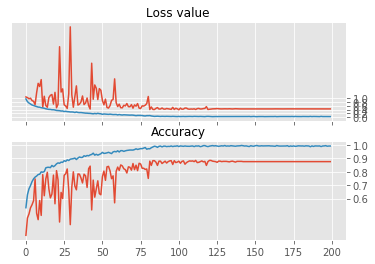

In [0]:
records     = pd.read_csv(modelname +'.csv')
plt.figure()
plt.subplot(211)
plt.plot(records['val_loss'])
plt.plot(records['loss'])
plt.yticks([0,0.20,0.40,0.60,0.80,1.00])
plt.title('Loss value',fontsize=12)

ax          = plt.gca()
ax.set_xticklabels([])



plt.subplot(212)
plt.plot(records[valacc])
plt.plot(records[acc])
plt.yticks([0.6,0.7,0.8,0.9,1.0])
plt.title('Accuracy',fontsize=12)
plt.show()

### Interactive Visualization with Tensorboard

In [0]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
%tensorboard --logdir ./vgglogs

# Build InceptionResnet Model

## Define helper functions

In [0]:
def conv2d_bn(x,nfilters,filter_size,strides=1,padding='same',activation='relu', name=None):
  x = Conv2D(nfilters,filter_size,strides,padding=padding,
             data_format='channels_last',use_bias=False,
             kernel_initializer='he_normal',
             kernel_regularizer=regularizers.l2(0.00005),name=name+'_conv2d')(x)
  x = BatchNormalization(axis=3,scale=False,name=name+'_conv2d'+'_bn')(x)
  if activation is not None:
      activation_name = None if name is None else name + '_ac'
      x = Activation(activation,name=activation_name)(x)
  return x

In [0]:
def inception_module_bn(layer_in, f1, f2_in, f2_out, f3_in, f3_out, f4_out, activation='relu', name=None):
	# 1x1 conv
	conv1 = conv2d_bn(layer_in, f1, 1, 1, padding='same', activation=activation, name=name+'_c11')
	# 3x3 conv
	conv3 = conv2d_bn(layer_in, f2_in, 1, 1, padding='same', activation=activation, name=name+'_c31')
	conv3 = conv2d_bn(conv3, f2_out, 3, 1, padding='same', activation=activation, name=name+'_c32')
	# 5x5 conv
	conv5 = conv2d_bn(layer_in, f3_in, 5, 1, padding='same', activation=activation, name=name+'_c51')
	conv5 = conv2d_bn(conv5, f3_out, 5, 1, padding='same', activation=activation, name=name+'_c52')
	# 3x3 max pooling
	pool = MaxPooling2D((3,3), strides=(1,1), padding='same', name=name+'_p11')(layer_in)
	pool = conv2d_bn(pool, f4_out, 1, 1, padding='same', activation=activation, name=name+'_p12')
	# concatenate filters, assumes filters/channels last
	layer_out = concatenate([conv1, conv3, conv5, pool], axis=-1)
	return layer_out

In [0]:
# Based on 35×35grid  (Inception-ResNet-A)

def inception_resnet_blk(layer_in, f0, f1_in, f1_out, f2_in, f2_mid, f2_out, fc, scale, activation='relu', name=None):
    # Branch 0: 1x1 conv
    branch0 = conv2d_bn(layer_in, f0, 3, 1, padding='same', activation=activation, name=name+ '_b0')

    # Branch 1: 1x1 conv + 3x3 conv
    branch1 = conv2d_bn(layer_in, f1_in, 3, 1, padding='same', activation=activation, name=name+ '_b11')
    branch1 = conv2d_bn(branch1, f1_out, 3, 1, padding='same', activation=activation, name=name+ '_b12')

    # Branch 2: 1x1 conv + 3x3 conv + 3x3 conv
    branch2 = conv2d_bn(layer_in, f2_in, 3, 1, padding='same', activation=activation, name=name+ '_b21')
    branch2 = conv2d_bn(branch2, f2_mid, 3, 1, padding='same', activation=activation, name=name+ '_b22')
    branch2 = conv2d_bn(branch2, f2_out, 3, 1, padding='same', activation=activation, name=name+ '_b23')

	# Concatenate
    branches = [branch0,branch1,branch2]
    mixed = concatenate(branches, axis=3, name=name + '_concat')
    filter_concat = conv2d_bn(mixed,fc,1,1,padding='same',activation=None,name=name+'_filter_concat')

	# add together
    layer_out = Lambda(lambda inputs, scale: inputs[0] + inputs[1] * scale,
                    output_shape=backend.int_shape(layer_in)[1:],
                    arguments={'scale': scale},
                    name=name+'_act_scaling')([layer_in, filter_concat])
                    
    return layer_out

## Create Model

In [0]:
def createInceptionResNetModel():
    name='IR'

    inp = Input(shape=(img_size,img_size,3))
    x = conv2d_bn(inp, 32, 3, 1, padding='same', activation='relu', name=name+ '_c1')
    x = conv2d_bn(x, 32, 3, 1, padding='same', activation='relu', name=name+ '_c2')
    x = conv2d_bn(x, 64, 3, 1, padding='same', activation='relu', name=name+ '_c3')
    x = MaxPooling2D((3, 3), strides=(2, 2), name='max_pool_1_3x3/2')(x)
    x = conv2d_bn(x, 80, 3, 1, padding='same', activation='relu', name=name+ '_c4')
    x = conv2d_bn(x, 192, 3, 1, padding='same', activation='relu', name=name+ '_c5')
    x = MaxPooling2D((3, 3), strides=(2, 2), name='max_pool_2_3x3/2')(x)
    
    x = inception_module_bn(x, 96, 48, 64, 64, 96, 96, activation='relu', name='i1')

    x = inception_resnet_blk(x, 32, 32, 32, 32, 48, 64, 352, 0.15, activation='relu', name='ir1')
    x = inception_resnet_blk(x, 32, 32, 32, 32, 48, 64, 352, 0.15, activation='relu', name='ir2')

    x = Flatten()(x)
    x = Dense(128, activation='relu',kernel_initializer='he_normal',
             kernel_regularizer=regularizers.l2(0.00005))(x)
    x = Dropout(0.5)(x)
    x = Dense(num_classes, activation='softmax',kernel_initializer='he_normal')(x)
    
    # process model
    model = Model(inputs=inp, outputs=x)
    model.compile(loss='categorical_crossentropy',
                 optimizer=RAdam(total_steps=10000, warmup_proportion=0.1, min_lr=1e-5),
                 metrics=['accuracy'])
    
    return model

In [0]:
# Setup the models
IRModel       = createInceptionResNetModel() # This is meant for training
IRModelGo     = createInceptionResNetModel() # This is used for final testing

IRModel.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
IR_c1_conv2d (Conv2D)           (None, 64, 64, 32)   864         input_5[0][0]                    
__________________________________________________________________________________________________
IR_c1_conv2d_bn (BatchNormaliza (None, 64, 64, 32)   96          IR_c1_conv2d[0][0]               
__________________________________________________________________________________________________
IR_c1_ac (Activation)           (None, 64, 64, 32)   0           IR_c1_conv2d_bn[0][0]            
____________________________________________________________________________________________

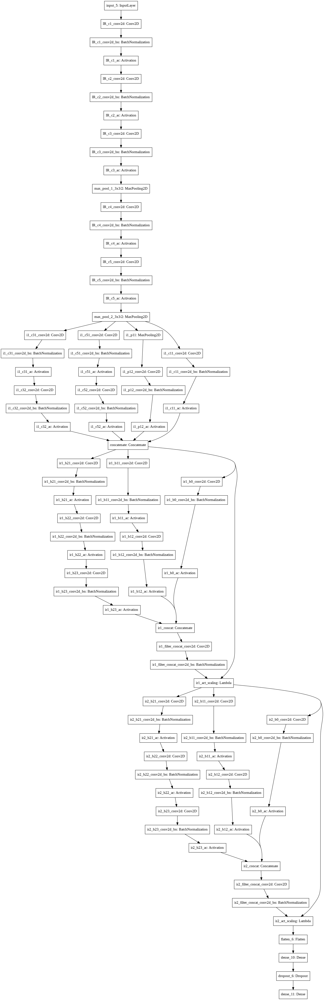

In [0]:
plot_model(IRModel, to_file='InceptionResNetModel.png')

## Train Model

In [0]:
def lrSchedule(epoch):
    lr  = 1e-3
    
    if epoch > 160:
        lr  *= 0.5e-3
        
    elif epoch > 140:
        lr  *= 1e-3
        
    elif epoch > 120:
        lr  *= 1e-2
        
    elif epoch > 80:
        lr  *= 1e-1
        
    print('Learning rate: ', lr)
    
    return lr

In [0]:
modelname = 'InceptionResNetModel'

In [0]:
with open(f'{modelname}_arch.json', 'w') as f:
    f.write(IRModel.to_json())

In [0]:
                            # Create checkpoint for the training
                            # This checkpoint performs model saving when
                            # an epoch gives highest testing accuracy
filepath        = modelname + ".hdf5"
checkpoint      = ModelCheckpoint(filepath, 
                                  monitor=valacc, 
                                  verbose=0, 
                                  save_best_only=True, 
                                  mode='max')

                            # Log the epoch detail into csv
csv_logger      = CSVLogger(modelname +'.csv')

tensorboard = TensorBoard(log_dir='./irlogs', histogram_freq=1, write_graph=True, write_images=True)

LRScheduler     = LearningRateScheduler(lrSchedule)

callbacks_list  = [checkpoint,csv_logger,tensorboard,LRScheduler]

In [0]:
IRModel.fit_generator(datagen.flow(trDat, trLbl, batch_size=batch_size),
                      validation_data=(tsDat, tsLbl),
                      epochs=200, 
                      verbose=1,
                      max_queue_size=100,
                      steps_per_epoch=len(trDat)/batch_size,
                      callbacks=callbacks_list)

Learning rate:  0.001
Epoch 1/200
90/89 [==============================] - 67s 740ms/step - loss: 1.4688 - accuracy: 0.3997 - val_loss: 1.3467 - val_accuracy: 0.3785
Learning rate:  0.001
Epoch 2/200
90/89 [==============================] - 26s 286ms/step - loss: 1.1740 - accuracy: 0.5353 - val_loss: 1.2968 - val_accuracy: 0.4630
Learning rate:  0.001
Epoch 3/200
90/89 [==============================] - 26s 286ms/step - loss: 1.1133 - accuracy: 0.6028 - val_loss: 1.0616 - val_accuracy: 0.6320
Learning rate:  0.001
Epoch 4/200
90/89 [==============================] - 26s 286ms/step - loss: 1.0436 - accuracy: 0.6276 - val_loss: 0.9873 - val_accuracy: 0.6725
Learning rate:  0.001
Epoch 5/200
90/89 [==============================] - 25s 280ms/step - loss: 0.9822 - accuracy: 0.6717 - val_loss: 1.0174 - val_accuracy: 0.6673
Learning rate:  0.001
Epoch 6/200
90/89 [==============================] - 25s 281ms/step - loss: 0.9468 - accuracy: 0.6920 - val_loss: 1.1947 - val_accuracy: 0.6479
Lear

## Evaluate Model

In [0]:
                            # Now the training is complete, we get
                            # another object to load the weights
                            # compile it, so that we can do 
                            # final evaluation on it
IRModelGo.load_weights(filepath)
IRModelGo.compile(loss='categorical_crossentropy', 
                  optimizer=RAdam(total_steps=10000, warmup_proportion=0.1, min_lr=1e-5), 
                  metrics=['accuracy'])

In [0]:
predicts    = IRModelGo.predict(tsDat)

In [0]:
                            # Prepare the classification output
                            # for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['Roti Prata',
               'Chicken Rice',
               'Bak Chor Mee',]

In [0]:
testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)

### Classifier Performance

In [0]:
print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 94.54%
              precision    recall  f1-score   support

  Roti Prata     0.9031    0.9672    0.9340       183
Chicken Rice     0.9638    0.9383    0.9509       227
Bak Chor Mee     0.9735    0.9304    0.9515       158

    accuracy                         0.9454       568
   macro avg     0.9468    0.9453    0.9455       568
weighted avg     0.9469    0.9454    0.9456       568

[[177   4   2]
 [ 12 213   2]
 [  7   4 147]]


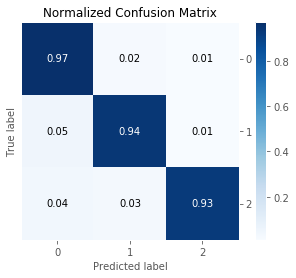

In [0]:
skplt.metrics.plot_confusion_matrix(testout, predout, normalize=True)

### Visualize Accuracy and Loss Metrics

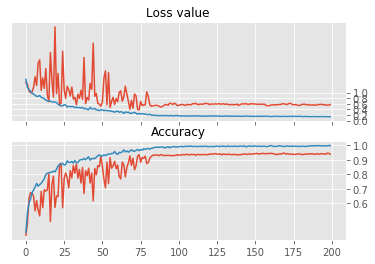

In [0]:
records     = pd.read_csv(modelname +'.csv')
plt.figure()
plt.subplot(211)
plt.plot(records['val_loss'])
plt.plot(records['loss'])
plt.yticks([0,0.20,0.40,0.60,0.80,1.00])
plt.title('Loss value',fontsize=12)

ax          = plt.gca()
ax.set_xticklabels([])



plt.subplot(212)
plt.plot(records[valacc])
plt.plot(records[acc])
plt.yticks([0.6,0.7,0.8,0.9,1.0])
plt.title('Accuracy',fontsize=12)
plt.show()

### Interactive Visualization with Tensorboard

In [0]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
%tensorboard --logdir ./irlogs

# Download saved models and files

Due to large file size, you can download these files using [Croc](https://github.com/schollz/croc) efficiently.  Alternatively mounting Google Drive and copying the files there can be considered.

Windows Install:  
```
$ scoop bucket add schollz-bucket https://github.com/schollz/scoop-bucket.git
$ scoop install croc
```

Mac Install:
```
$ brew install schollz/tap/croc
```

Linux/Windows Subsystem for Linux Install:
```
$ curl https://getcroc.schollz.com | bash
```

Command to enter on desktop side:  
`croc -yes <provided-pass-code>`

In [0]:
!curl https://getcroc.schollz.com | bash

In [0]:
!croc send *.json *.hdf5 *.csv *.png